In [49]:
import cv2,os
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import tensorflow as tf

In [223]:
img=Image.open('IMG_20190401_165405586.jpg')

In [224]:
img=np.asarray(img)

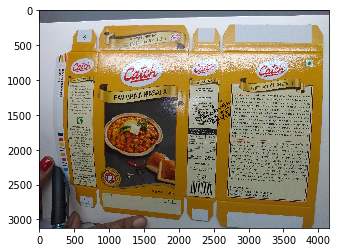

In [26]:
plt.imshow(img)

In [36]:
img[img>100]-=20

In [225]:
img.setflags(write=1)

In [37]:
Image.fromarray(img).save('color.jpg')

In [39]:
img1=img

In [42]:
img2=img

In [44]:
np.max(img1)

225

In [45]:
np.max(img2)

255

(array([1376236., 1070074.,  958585.,  782668., 1078782., 1051313.,
         898731.,  476232.,  506389.,  497089., 1025936., 2112570.,
        4219934., 3208602., 2625047., 2286976., 2191571., 1531886.,
        1576985., 1248578., 1553187., 1033024., 1293415.,  813203.,
         928236.,  784964.,  767085.,  435739.,  322290.,  282273.]),
 array([  0. ,   7.5,  15. ,  22.5,  30. ,  37.5,  45. ,  52.5,  60. ,
         67.5,  75. ,  82.5,  90. ,  97.5, 105. , 112.5, 120. , 127.5,
        135. , 142.5, 150. , 157.5, 165. , 172.5, 180. , 187.5, 195. ,
        202.5, 210. , 217.5, 225. ]),
 <a list of 30 Patch objects>)

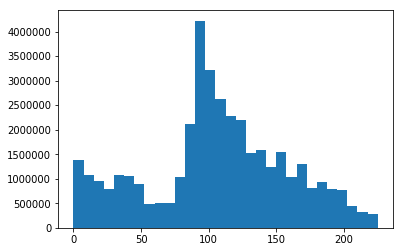

In [46]:
plt.hist(img1.flatten(),bins=30)

(array([1561415., 1124371., 1043645.,  958362., 1336757., 1027828.,
         640243.,  506389.,  661987.,  798804., 1108996.,  973348.,
        1343414., 1338463., 2453771., 2709397., 3009131., 2452398.,
        2234174., 1619375., 1631688., 1567968., 1357623., 1289218.,
         993699.,  927656.,  969035.,  545492.,  446166.,  306787.]),
 array([  0. ,   8.5,  17. ,  25.5,  34. ,  42.5,  51. ,  59.5,  68. ,
         76.5,  85. ,  93.5, 102. , 110.5, 119. , 127.5, 136. , 144.5,
        153. , 161.5, 170. , 178.5, 187. , 195.5, 204. , 212.5, 221. ,
        229.5, 238. , 246.5, 255. ]),
 <a list of 30 Patch objects>)

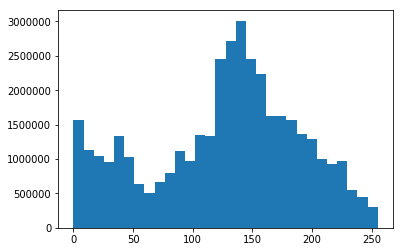

In [47]:
plt.hist(img2.flatten(),bins=30)

In [48]:
img.shape

(3120, 4160, 3)

In [226]:
image=cv2.resize(img,(800,800))

In [141]:
#simple rotation using wrap interpolation
angles=np.random.random_sample([250])*10-5
for i in range(250):
    ans=rotate(image,angle=angles[i],mode='wrap')
    Image.fromarray(ans).save('positive/wrap_'+str(i)+'.jpg')

In [170]:
#subtracting pixels from the image to change the color
for i in range(250):
    pix=np.random.randint(1,10)
    temp=cv2.resize(img,(800,800))
    temp[temp>15]-=pix
    Image.fromarray(temp).save('positive/color_'+str(i)+'.jpg')

In [245]:
files=os.listdir('negative')

In [246]:
#simple rotation using reflect interpolation

j=0
for i in files[:700]:
    if('color' in i):
        pass
    else:
        pix=np.random.randint(1,15)
        img=Image.open('negative/'+i)
        img=np.asarray(img)
        img.setflags(write=1)
        ans=rotate(img,angle=pix,mode='reflect')
        Image.fromarray(img).save('negative/color3_'+str(j)+'.jpg')
        j+=1

In [78]:
from scipy.ndimage.interpolation import rotate

In [135]:
ans=rotate(image,angle=2,mode='wrap')

In [197]:
pos=os.listdir('positive')

In [209]:
image[:,:,2]-=1

In [207]:
image

array([[[ 8, 14, 14],
        [13, 14,  9],
        [13, 15, 16],
        ...,
        [11, 11, 13],
        [ 8, 11, 13],
        [13, 15, 11]],

       [[11, 13, 14],
        [11, 14, 15],
        [15,  9, 16],
        ...,
        [11, 11, 13],
        [ 9, 10, 12],
        [ 7, 10, 13]],

       [[13, 12, 14],
        [10, 12, 13],
        [ 7, 10, 11],
        ...,
        [ 7, 14,  9],
        [10, 10, 12],
        [11, 14, 15]],

       ...,

       [[13, 13, 12],
        [14, 12, 10],
        [ 9, 14, 13],
        ...,
        [13, 11, 15],
        [12, 11, 15],
        [13, 15, 15]],

       [[10, 13, 14],
        [ 9, 15, 16],
        [10, 13, 13],
        ...,
        [13, 12, 16],
        [13, 12, 16],
        [12, 11, 15]],

       [[10, 10, 10],
        [14, 15, 15],
        [14, 13, 13],
        ...,
        [11, 14, 14],
        [13, 12, 16],
        [14,  9, 16]]], dtype=uint8)

In [243]:
for i in range(200):
    pix=np.random.randint(16,50)
    temp=cv2.resize(img,(800,800))
    temp[:,:,2]-=pix
    Image.fromarray(temp).save('negative/twelth_'+str(i)+'.jpg')

In [227]:
image[:,:,0]+=30

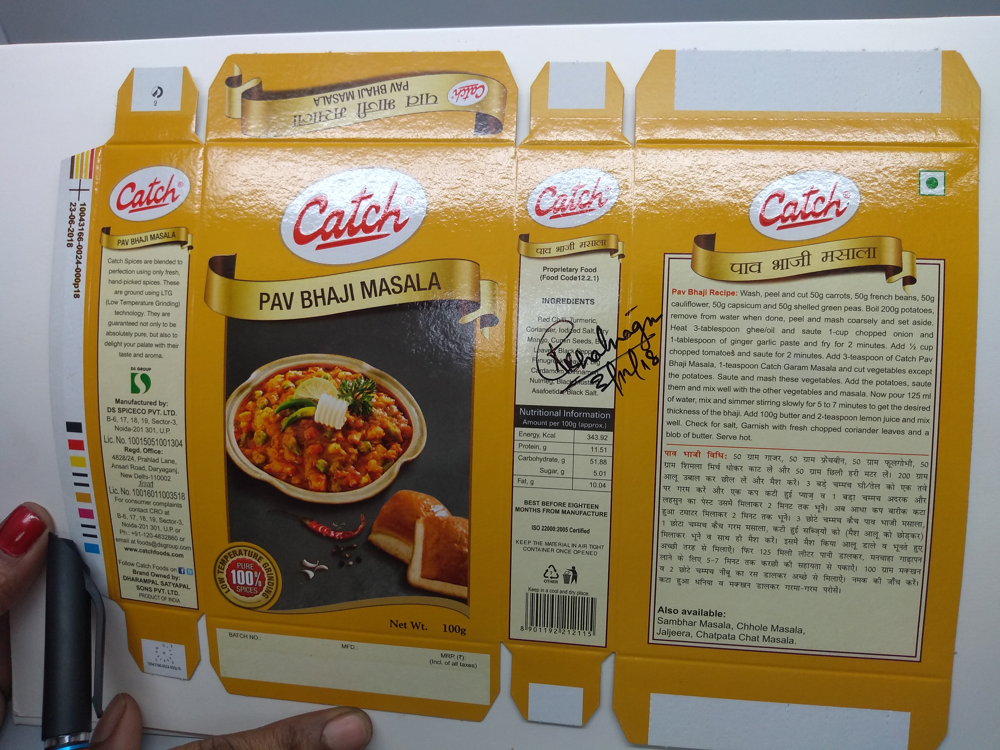

In [247]:
from joblib import load

In [249]:
clf=load('model.joblib')

In [250]:
def predict(image):
    img=cv2.resize(image,(800,800))
    r,g,b=np.histogram(img[:,:,0],bins=256)[0],np.histogram(img[:,:,1],bins=256)[0],np.histogram(img[:,:,2],bins=256)[0]
    x=np.zeros([1,768])
    x[0]=np.stack([r,g,b]).flatten()
    ans=clf.predict(x)
    if(ans[0]==0):
        print('Defective')
    else:
        print('OK')

In [254]:
neg=os.listdir('negative')

In [257]:
predict(cv2.imread('negative/'+neg[50]))

Defective


In [ ]:
show